# Synopsis

# Setup

## Config

In [1]:
# novels wosds wosml lsi airbnb anphoblacht winereviews dscourses faulkner fra
project_slug = 'winereviews'
base_path  = '/Users/rca2t/Dropbox/CODE/polo2-test/projects'
# label_col = 'doc_label'
label_col = 'maxtopic'

In [2]:
import sqlite3
import pandas as pd
import numpy as np
import plotly_express as px

## Pragmas

In [3]:
%matplotlib inline

# Process

## Get PCA Data

In [4]:
def get_files():
    corpus_db_file = '{0}/{1}/{1}-corpus.db'.format(base_path, project_slug)
    mallet_db_file = '{0}/{1}/{1}-mallet-20topics.db'.format(base_path, project_slug)
    return corpus_db_file, mallet_db_file 

In [5]:
corpus_db_file, mallet_db_file = get_files()

In [6]:
with sqlite3.connect(corpus_db_file) as db:
    docs = pd.read_sql('select * from doc where doc_label is not null', db, index_col='doc_id')
    vocab = pd.read_sql("select * from token", db, index_col=['token_id'])
    pca_items = pd.read_sql("select * from pca_item", db, index_col=['pc_id'])
    pca_docs = pd.read_sql("select * from pca_doc order by random() limit 10000", db, index_col=['doc_id'])
    pca_terms = pd.read_sql("select * from pca_term", db, index_col=['token_id'])

In [7]:
with sqlite3.connect(mallet_db_file) as db:
    docs2 = pd.read_sql("select * from doc", db, index_col=['doc_id'])
    doctopics = pd.read_sql("select * from doctopic", db, index_col=['doc_id','topic_id'])
    topicwords = pd.read_sql("select * from topicword", db, index_col=['word_id','topic_id'])
    topics = pd.read_sql("select * from topic", db)
    words = pd.read_sql("select * from word", db, index_col=['word_id'])
docs['maxtopic'] = docs2['maxtopic'].apply(lambda x: 'T{}'.format(x))

In [8]:
docs.head()

,doc_key,doc_title,doc_label,doc_province,doc_points,doc_price,doc_content,doc_original,doc_variety,doc_taster,doc_place,token_count,doc_sentiment_polarity,doc_sentiment_subjectivity,maxtopic
doc_id,,,,,,,,,,,,,,,
0,0,0: Nicosia 2013 Vulkà Bianco (Etna) Vulkà Bia...,Italy,Sicily & Sardinia,87,NaN,"Aromas include tropical fruit, broom, brimston...","Aromas include tropical fruit, broom, brimston...",White Blend,Kerin O’Keefe,Italy Sicily & Sardinia Etna,20,0.1,0.73,T13
1,1,1: Quinta dos Avidagos 2011 Avidagos Red (Dour...,Portugal,Douro,87,15.0,"This is ripe and fruity, a wine that is smooth...","This is ripe and fruity, a wine that is smooth...",Portuguese Red,Roger Voss,Portugal Douro,19,0.2,0.46,T12
2,2,2: Rainstorm 2013 Pinot Gris (Willamette Valle...,US,Oregon,87,14.0,"Tart and snappy, the flavors of lime flesh and...","Tart and snappy, the flavors of lime flesh and...",Pinot Gris,Paul Gregutt,US Oregon Willamette Valley Willamette Valley,16,0.0,0.36,T5
3,3,3: St. Julian 2013 Reserve Late Harvest Riesli...,US,Michigan,87,13.0,"Pineapple rind, lemon pith and orange blossom ...","Pineapple rind, lemon pith and orange blossom ...",Riesling,Alexander Peartree,US Michigan Lake Michigan Shore,20,0.2,0.33,T5
4,4,4: Sweet Cheeks 2012 Vintner's Reserve Wild Ch...,US,Oregon,87,65.0,"Much like the regular bottling from 2012, this...","Much like the regular bottling from 2012, this...",Pinot Noir,Paul Gregutt,US Oregon Willamette Valley Willamette Valley,22,0.3,0.45,T2


In [9]:
px.bar(pca_items, y='explained_variance', height=300, width=500)

## Bind components to doc and word tables

In [10]:
V = vocab.join(pca_terms, on='token_id', how='inner', rsuffix='_x')
D = docs.join(pca_docs, on='doc_id', how='inner')
COMPS = [col for col in pca_terms.columns if 'PC' in col]
pc_k = len(COMPS)

## Inspect components

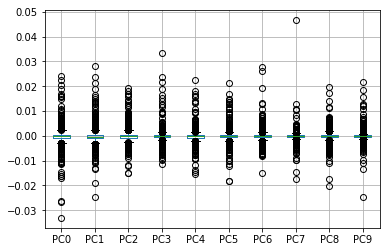

In [11]:
V[COMPS].boxplot()

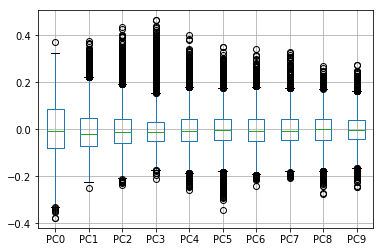

In [12]:
D[COMPS].boxplot()

## Show table contents

In [13]:
V[COMPS].head()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
token_id,,,,,,,,,,
95,-0.000531,-0.001309,0.000537,-0.000441,0.000563,0.000684,0.000040,-0.000071,0.000118,-0.000520
96,-0.000703,-0.001223,0.000503,0.000002,-0.000870,-0.000460,0.000722,-0.000776,0.000393,0.000104
99,-0.000921,-0.001428,-0.000437,-0.000253,0.000357,0.000420,0.000555,0.001053,0.000679,0.000311
119,-0.000967,0.000182,0.001441,0.000467,-0.000058,-0.000387,0.001011,-0.000219,0.000121,-0.000292
192,0.000296,-0.000634,-0.000591,-0.000022,0.000201,-0.000021,-0.000479,0.000688,0.000278,-0.000358


In [14]:
D[COMPS].head()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
doc_id,,,,,,,,,,
2,0.166985,-0.046859,-0.044568,0.030157,0.046400,0.023296,-0.070606,-0.049627,-0.056405,0.071761
4,-0.013727,-0.022998,-0.090841,-0.012825,0.071309,-0.012232,-0.115651,-0.004668,0.019360,-0.031728
9,0.264997,0.148140,0.121359,0.038542,0.061883,0.067970,-0.027547,-0.084617,0.013835,0.050202
20,-0.138534,-0.072144,0.032205,-0.030142,-0.005580,-0.005856,0.001537,-0.013124,0.097905,-0.068936
27,-0.176910,-0.077195,0.217346,-0.083042,-0.017192,-0.007179,0.213025,0.030339,-0.101169,-0.015147


## Get component terms (loadings)

In [15]:
DX = D[[label_col]+COMPS]

In [16]:
topics.topic_gloss.values

array(['residual sugar', 'pinot noir', 'petite sirah', 'show nose',
       'black cherry', 'sauvignon blanc', 'pinot noir', 'one best',
       'cabernet sauvignon', 'black cherry', 'nero davola',
       'stainless steel', 'touriga nacional', 'stone fruit',
       'fruit flavors', 'berry flavors', 'residual sugar', 'pinot noir',
       'crisp acidity', 'full bodied'], dtype=object)

In [17]:
DX.head()

,maxtopic,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
doc_id,,,,,,,,,,,
2,T5,0.166985,-0.046859,-0.044568,0.030157,0.046400,0.023296,-0.070606,-0.049627,-0.056405,0.071761
4,T2,-0.013727,-0.022998,-0.090841,-0.012825,0.071309,-0.012232,-0.115651,-0.004668,0.019360,-0.031728
9,T18,0.264997,0.148140,0.121359,0.038542,0.061883,0.067970,-0.027547,-0.084617,0.013835,0.050202
20,T9,-0.138534,-0.072144,0.032205,-0.030142,-0.005580,-0.005856,0.001537,-0.013124,0.097905,-0.068936
27,T4,-0.176910,-0.077195,0.217346,-0.083042,-0.017192,-0.007179,0.213025,0.030339,-0.101169,-0.015147


In [18]:
topics['label'] = 'T' + topics.topic_id.astype('str') + ' ' + topics.topic_gloss.astype('str')

In [19]:
labels = {'T{}'.format(topics.loc[x].topic_id):topics.loc[x].label for x in topics.index}

In [20]:
px.scatter_3d(DX, x='PC0', y='PC1', z='PC2', labels=labels, color=label_col, height=1000, width=1000)

In [21]:
px.scatter_3d(DX, x='PC3', y='PC4', z='PC5', color=label_col, height=1000, width=1000)

In [22]:
def draw_pca(df, x=1, y=2):
    xname = 'PC{}'.format(x)
    yname = 'PC{}'.format(y)
    
    xlabel = '{}:\n- {}\n+ {}'.format(xname, pca_items.loc[x].neg, pca_items.loc[x].pos)
    ylabel = '{}:\n- {}\n+ {}'.format(yname, pca_items.loc[y].neg, pca_items.loc[y].pos)
    print(xlabel)
    print(ylabel)
    
    title = "{} vs {}".format(xname,yname)
    return px.scatter(df, 
                      x=xname, 
                      y=yname, 
                      color=label_col, 
                      marginal_x='violin', 
                      marginal_y='violin', 
#                       range_x = [-.5, .5],
#                       range_y = [-.5, .5],
                      title=title, 
                      height=700, 
                      width=800)

In [23]:
draw_pca(DX, 0, 1)

PC0:
- black tannins cherry cabernet blackberry plum dark berry chocolate spice licorice firm red pepper merlot
+ apple crisp citrus acidity lemon peach pear fresh white light lime fruity green bright clean
PC1:
- aromas finish nose notes white cherry offers apple peach flavors lead green dried note alongside
+ fruits ripe rich acidity tannins character aging fruity structure wood texture age full firm years


In [24]:
draw_pca(DX, 1, 2)

PC1:
- aromas finish nose notes white cherry offers apple peach flavors lead green dried note alongside
+ fruits ripe rich acidity tannins character aging fruity structure wood texture age full firm years
PC2:
- flavors oak cabernet sweet dry rich blackberry sauvignon chocolate good finish tannic vanilla bit cherries
+ red acidity bright alongside fresh offers tannins white cherry berry juicy black aromas opens fruits


In [25]:
draw_pca(DX, 2, 3)

PC2:
- flavors oak cabernet sweet dry rich blackberry sauvignon chocolate good finish tannic vanilla bit cherries
+ red acidity bright alongside fresh offers tannins white cherry berry juicy black aromas opens fruits
PC3:
- ripe rich aromas finish wood dark fruit dense firm full plum concentrated aging peach berry
+ cabernet sauvignon blend merlot red light franc fruity crisp soft bright fresh petit verdot syrah


In [26]:
draw_pca(DX, 3, 4)

PC3:
- ripe rich aromas finish wood dark fruit dense firm full plum concentrated aging peach berry
+ cabernet sauvignon blend merlot red light franc fruity crisp soft bright fresh petit verdot syrah
PC4:
- white cabernet fruit sauvignon offers peach black alongside merlot blend pear rich dried yellow lemon
+ berry flavors plum finish red herbal light fruity soft feels fruits raspberry fresh aromas good


# Topics and Components

## Bind topics to doc table

In [27]:
dtm = doctopics.topic_weight.unstack()
TOPICS = ['T{}'.format(col) for col in dtm.columns]
t_k = len(TOPICS)
dtm.columns = TOPICS

In [28]:
try:
    D = D.join(dtm, on='doc_id', how='inner')
except ValueError as e:
    D = D.drop(TOPICS, 1)
    D = D.join(dtm, on='doc_id', how='inner')

## Bind topics to word table

In [29]:
twm = topicwords.word_count.unstack().fillna(0)
twm.columns = TOPICS

twm['token_str'] = words.word_str
twm['token_id'] = twm.token_str.map(V.reset_index().set_index('token_str')['token_id']).fillna(-1).astype('int')
twm = twm.reset_index(drop=True).set_index('token_id')

try:
    V = V.join(twm[TOPICS], on='token_id', how='inner')
except ValueError as e:
    V = V.drop(TOPICS, 1)
    V = V.join(twm[TOPICS], on='token_id', how='inner')

In [30]:
D['doc_label'].isna().value_counts()

False    9995
Name: doc_label, dtype: int64

## Correlate Topics and Components via Docs

## Simple dot product of topic and component matrices

In [31]:
X = D[TOPICS].T.dot(D[COMPS])
X.columns.name = 'pc_id'
X.index.name = 'topic_id'

## Find opposing topics per component

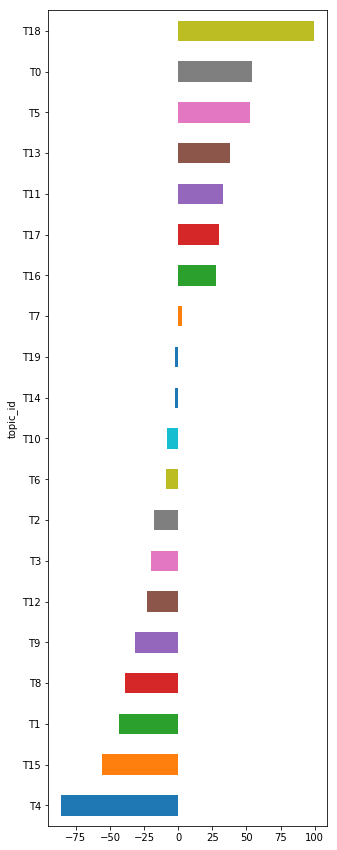

In [32]:
X['PC0'].sort_values().plot(kind='barh', figsize=(5, 15))

In [33]:
X.style.background_gradient(cmap='bwr')

pc_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
topic_id,,,,,,,,,,
T0,54.0709,-18.5808,0.503313,-5.592,-9.31641,0.20836,-11.1043,-11.3737,26.4558,-20.8279
T1,-43.5682,25.002,-59.6212,22.3429,3.53098,-55.4057,6.5641,-39.8597,-19.3628,-4.4435
T2,-17.6337,-1.76737,-6.90184,7.04445,-9.84005,-12.3073,-2.02915,-2.14698,10.0474,6.15176
T3,-19.8747,-14.7172,4.10296,2.65526,-3.2044,-11.3948,-11.0597,0.0742285,27.7297,-0.459376
T4,-86.2275,-38.9275,90.9163,-11.7018,-22.2039,-10.9598,11.3043,-11.2515,-21.154,4.59373
T5,52.4651,-33.0161,-4.08714,-5.14136,-11.5904,10.6856,-4.99903,-5.56013,11.9751,-5.65962
T6,-8.99575,0.033969,-15.62,5.68115,-5.36796,-12.2797,-10.646,19.0437,-2.39393,2.80489
T7,2.71583,2.57617,-8.74093,2.12789,-4.02095,-4.85582,-4.10006,0.750044,-0.710805,-2.25524
T8,-39.0138,-19.6632,-17.9239,35.3394,-17.1727,23.8241,3.63326,24.1655,1.44288,3.03891


## Convert to narrow with absolute values

In [34]:
Y = X.unstack().to_frame().sort_values(0, ascending=False).rename(columns={0:'x'})
Y['abs'] = np.abs(Y.x)
Y['sign'] = np.sign(Y.x).astype('int')
Y = Y.reset_index().set_index(['topic_id', 'pc_id', 'sign'])
Y = Y.sort_index()

In [35]:
Y.head()

x        abs
topic_id pc_id sign                      
T0       PC0    1    54.070889  54.070889
         PC1   -1   -18.580764  18.580764
         PC2    1     0.503313   0.503313
         PC3   -1    -5.592003   5.592003
         PC4   -1    -9.316414   9.316414

In [36]:
# Y['abs'].unstack().T.style.background_gradient(cmap='viridis')

In [37]:
Y.sort_values('abs', ascending=True).head(10)

,,,x,abs
topic_id,pc_id,sign,,
T17,PC6,1,0.020910,0.020910
T6,PC1,1,0.033969,0.033969
T3,PC7,1,0.074229,0.074229
T9,PC7,1,0.144166,0.144166
T0,PC5,1,0.208360,0.208360
T19,PC7,-1,-0.237664,0.237664
T15,PC7,1,0.428556,0.428556
T14,PC1,-1,-0.455764,0.455764
T3,PC9,-1,-0.459376,0.459376


## Distribution of topic-components

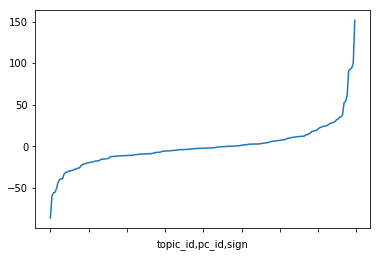

In [38]:
Y.x.sort_values().plot()

In [39]:
Y.describe().T

,count,mean,std,min,25%,50%,75%,max
x,200.0,-0.165504,25.782477,-86.227486,-11.070844,-2.324586,6.987268,151.48069
abs,200.0,15.907542,20.259372,0.020910,3.607692,10.002422,19.716099,151.48069


## Extract common words between topics and components

In [40]:
def show_words(topic_id, pc_id, sign):
    w1 = V[['token_str', topic_id]].sort_values(topic_id, ascending=False).head(20).token_str.tolist()
    if sign == 1:
        w2 = V[['token_str', pc_id]].sort_values(pc_id, ascending=False).head(10).token_str.tolist()
    elif  sign == -1:
        w2 = V[['token_str', pc_id]].sort_values(pc_id, ascending=True).head(10).token_str.tolist()
    else:
        w2 = []
    common = list(set(w1) & set(w2))
    return ' '.join(common)

In [41]:
Y['words'] = Y.apply(lambda x: show_words(x.name[0], x.name[1], x.name[2]), 1)

In [42]:
Y['n_words'] = Y['words'].apply(lambda x: len(x.split()))

In [43]:
# Y[Y.n_words > 0].sort_values('abs', ascending=False)

In [44]:
Y.loc[Y.n_words >= 5].sort_values('abs', ascending=False).words.values

array(['rich wood ripe acidity aging structure fruits character tannins',
       'fresh citrus acidity crisp apple light',
       'rich ripe acidity fruits fruity character',
       'finish berry feels flavors herbal plum',
       'offers alongside cherry berry acidity red tannins',
       'black cherry berry spice plum tannins',
       'finish aromas berry herbal fruits plum',
       'cabernet blackberry rich chocolate sweet flavors oak dry',
       'blackberry black chocolate cherry berry spice plum tannins',
       'cherries cherry pinot sweet cola red',
       'fresh peach citrus pear lemon acidity apple',
       'fresh peach white citrus pear lemon acidity apple crisp',
       'finish notes cherry aromas flavors nose',
       'cabernet blackberry black chocolate cherry tannins',
       'currant rich blackberry black dry',
       'cabernet black cherry spice tannins',
       'peach white citrus pear acidity apple crisp',
       'cabernet blend sauvignon merlot franc',
       'finis

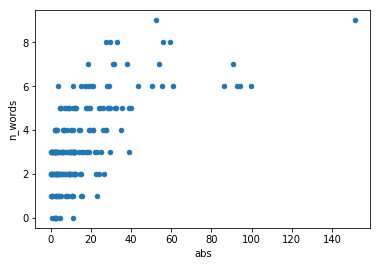

In [45]:
Y.plot(kind='scatter', x='abs', y='n_words')

## Compute Z scores

In [46]:
m = Y['abs'].mean()
s = np.sqrt(((Y['abs'] - m)**2).sum() / (Y.shape[0] - 1))
Y['z'] = (Y['abs'] - m) / s

In [47]:
Y.sort_values('z', ascending=False).head()

x         abs  \
topic_id pc_id sign                           
T12      PC1   1     151.480690  151.480690   
T18      PC0   1      99.607320   99.607320   
         PC1   1      94.415354   94.415354   
T15      PC4   1      92.559664   92.559664   
T4       PC2   1      90.916329   90.916329   

                                                                 words  \
topic_id pc_id sign                                                      
T12      PC1   1     rich wood ripe acidity aging structure fruits ...   
T18      PC0   1                fresh citrus acidity crisp apple light   
         PC1   1             rich ripe acidity fruits fruity character   
T15      PC4   1                finish berry feels flavors herbal plum   
T4       PC2   1     offers alongside cherry berry acidity red tannins   

                     n_words         z  
topic_id pc_id sign                     
T12      PC1   1           9  6.691873  
T18      PC0   1           6  4.131410  
         PC1   1           6  3.875136  
T15      PC4   1           6  3.783539  
T4       PC2   1           7  3.702424

In [48]:
Y[Y.z > 2].sort_values('z', ascending=False)

x         abs  \
topic_id pc_id sign                           
T12      PC1    1    151.480690  151.480690   
T18      PC0    1     99.607320   99.607320   
         PC1    1     94.415354   94.415354   
T15      PC4    1     92.559664   92.559664   
T4       PC2    1     90.916329   90.916329   
         PC0   -1    -86.227486   86.227486   
T15      PC5    1     61.103842   61.103842   
T1       PC2   -1    -59.621210   59.621210   

                                                                 words  \
topic_id pc_id sign                                                      
T12      PC1    1    rich wood ripe acidity aging structure fruits ...   
T18      PC0    1               fresh citrus acidity crisp apple light   
         PC1    1            rich ripe acidity fruits fruity character   
T15      PC4    1               finish berry feels flavors herbal plum   
T4       PC2    1    offers alongside cherry berry acidity red tannins   
         PC0   -1                black cherry berry spice plum tannins   
T15      PC5    1               finish aromas berry herbal fruits plum   
T1       PC2   -1    cabernet blackberry rich chocolate sweet flavo...   

                     n_words         z  
topic_id pc_id sign                     
T12      PC1    1          9  6.691873  
T18      PC0    1          6  4.131410  
         PC1    1          6  3.875136  
T15      PC4    1          6  3.783539  
T4       PC2    1          7  3.702424  
         PC0   -1          6  3.470983  
T15      PC5    1          6  2.230884  
T1       PC2   -1          8  2.157701

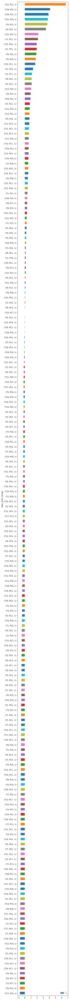

In [49]:
Y.sort_values('z').plot(kind='barh', y='z', figsize=(5,100))

In [50]:
Y.loc[('T2')].sort_values('z', ascending=False)

,,x,abs,words,n_words,z
pc_id,sign,,,,,
PC0,-1,-17.633699,17.633699,dark blackberry black cherry tannins,5,0.085203
PC5,-1,-12.307255,12.307255,red cherry,2,-0.177710
PC8,1,10.047382,10.047382,texture soft black pepper,4,-0.289257
PC4,-1,-9.840047,9.840047,fruit offers black,3,-0.299491
PC3,1,7.044451,7.044451,red soft,2,-0.437481
PC2,-1,-6.901838,6.901838,blackberry oak,2,-0.444520
PC9,1,6.151756,6.151756,blackberry acidity black oak,4,-0.481544
PC7,-1,-2.146981,2.146981,blackberry black pepper,3,-0.679220
PC6,-1,-2.029152,2.029152,,0,-0.685036


## Plot Topics vs Components

In [51]:
def plot_pc_v_topic(pc_x, t_x, topic_weight_min = .5):
    pc_min = D[pc_x].min()
    pc_max = D[pc_x].max()
    D[D[t_x] >= topic_weight_min].reset_index()\
        .plot(kind='scatter', x=pc_x, y=t_x, figsize=(10,5), xlim=(pc_min, pc_max))

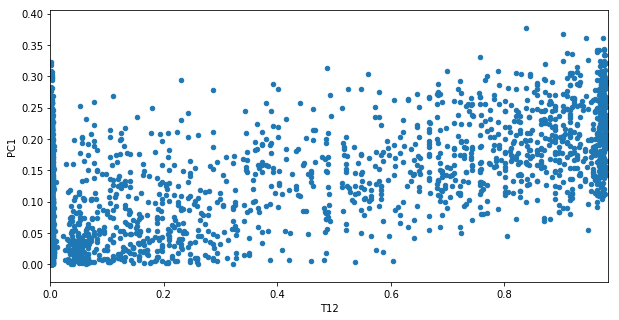

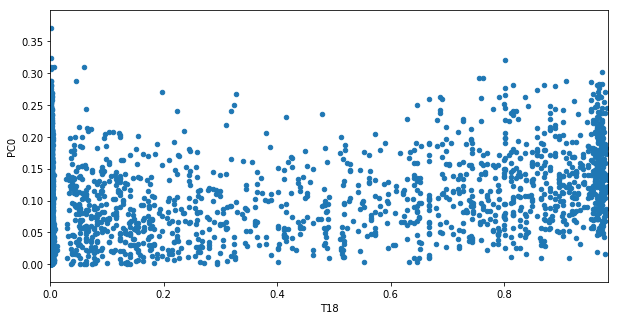

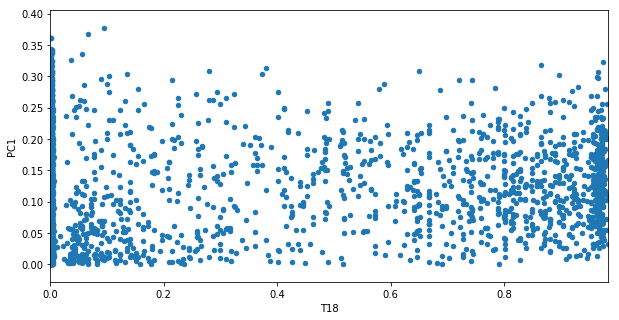

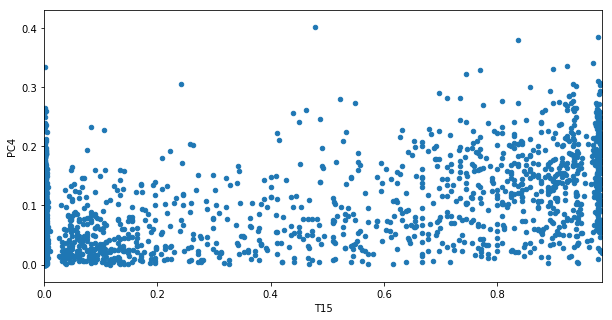

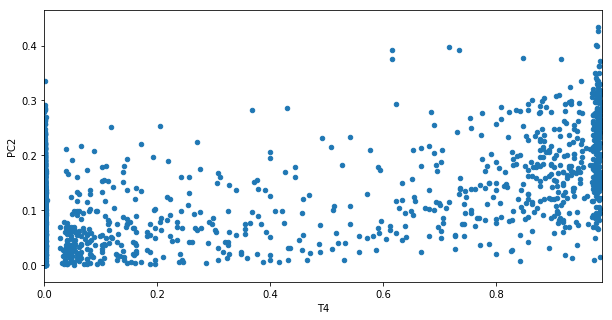

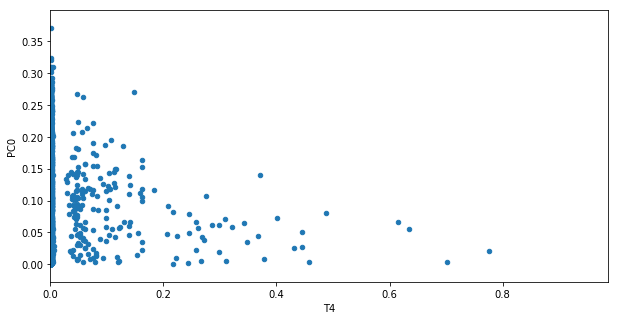

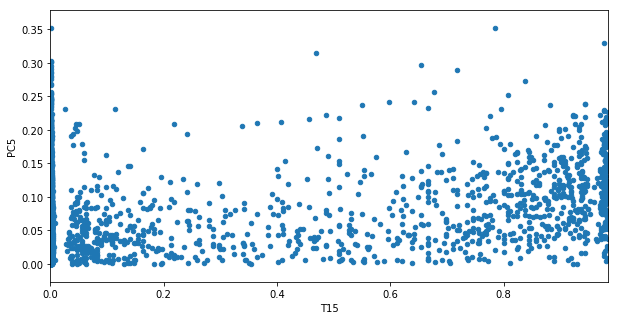

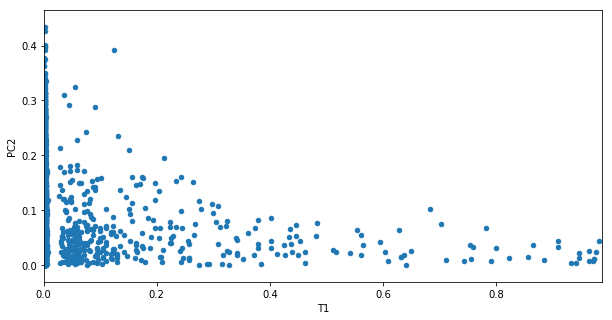

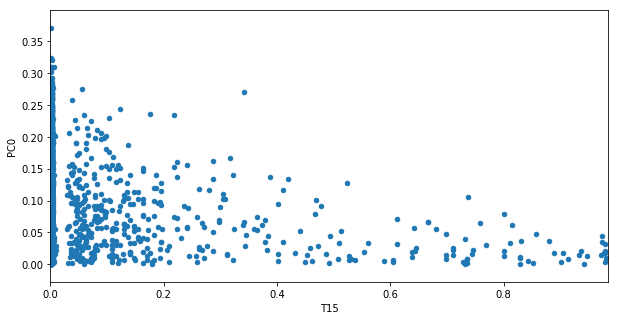

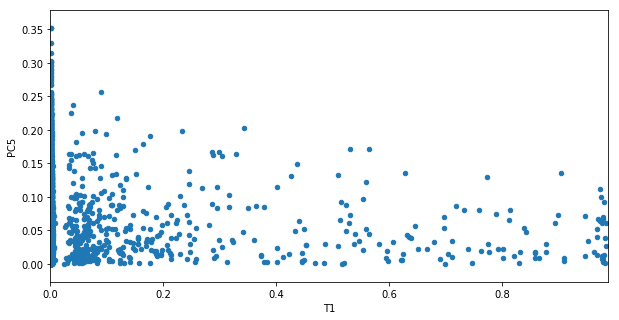

In [52]:
_ = Y.sort_values('abs', ascending=False).head(10).apply(lambda x: plot_pc_v_topic(x.name[0], x.name[1],  0), 1)

## Covariance 

In [53]:
COV = D[COMPS + TOPICS].cov().iloc[:pc_k, pc_k:]
CORR = D[COMPS + TOPICS].corr().iloc[:pc_k, pc_k:]

In [54]:
COV.T.style.background_gradient(cmap='bwr')

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
T0,0.00542165,-0.00184075,0.000153236,-0.000573395,-0.000963551,4.19283e-05,-0.00106021,-0.00113099,0.0026947,-0.0021122
T1,-0.00434356,0.00252758,-0.0058213,0.00221617,0.000309307,-0.0055143,0.000728236,-0.00397845,-0.00187072,-0.000484154
T2,-0.00175515,-0.000161708,-0.000606159,0.000693493,-0.00101033,-0.00121416,-0.000161266,-0.000209033,0.00104436,0.000592424
T3,-0.00198215,-0.00146199,0.000469803,0.000257702,-0.000338691,-0.00112802,-0.00107732,1.14939e-05,0.00280201,-6.21914e-05
T4,-0.00861631,-0.00387616,0.00920273,-0.00118511,-0.00225392,-0.00107499,0.00118337,-0.00111857,-0.00206786,0.000430725
T5,0.00525939,-0.00328772,-0.000320414,-0.000526373,-0.00118672,0.00108735,-0.000456401,-0.000550271,0.00123914,-0.000590547
T6,-0.000890982,1.82887e-05,-0.00147987,0.000557265,-0.000562433,-0.00121169,-0.00102415,0.00191121,-0.000201152,0.000257911
T7,0.000276546,0.000265598,-0.000830955,0.000207035,-0.000415642,-0.000476927,-0.000388653,7.80456e-05,-5.09485e-05,-0.000237615
T8,-0.00389446,-0.0019524,-0.00170919,0.00352471,-0.00174399,0.00240111,0.000405236,0.00242378,0.000183317,0.000280997
T9,-0.00314452,-0.00107271,-0.000248879,0.000242252,0.000669848,-0.000599125,0.000359039,2.05935e-05,0.00182756,-0.00052156


In [55]:
CORR.T.style.background_gradient(cmap='bwr')

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
T0,0.260193,-0.0987242,0.0094416,-0.0387481,-0.064928,0.00292981,-0.0772754,-0.086697,0.211672,-0.175985
T1,-0.177181,0.115223,-0.304867,0.127294,0.0177155,-0.327514,0.0451157,-0.259219,-0.124902,-0.034287
T2,-0.0995661,-0.0102517,-0.0441474,0.0553954,-0.0804737,-0.100287,-0.013894,-0.0189406,0.0969698,0.0583455
T3,-0.123983,-0.102195,0.0377277,0.0226973,-0.0297455,-0.102733,-0.102342,0.00114835,0.286868,-0.00675352
T4,-0.38182,-0.191956,0.523569,-0.0739483,-0.140239,-0.0693601,0.0796421,-0.0791741,-0.149985,0.033137
T5,0.29211,-0.204066,-0.0228478,-0.0411659,-0.0925447,0.0879323,-0.0384985,-0.0488168,0.112647,-0.0569432
T6,-0.0510309,0.00117061,-0.10882,0.0449427,-0.0452302,-0.101047,-0.0890868,0.174845,-0.0188573,0.0256455
T7,0.0320423,0.034391,-0.12361,0.0337778,-0.0676189,-0.0804592,-0.0683916,0.0144439,-0.00966219,-0.0477976
T8,-0.21801,-0.122141,-0.12284,0.277834,-0.137077,0.195709,0.0344526,0.216722,0.0167965,0.0273091
T9,-0.178297,-0.0679733,-0.0181175,0.0193415,0.0533285,-0.0494625,0.0309184,0.0018651,0.16961,-0.0513417


In [56]:
Y['cov'] = COV.stack()
Y['corr'] = CORR.stack()

In [57]:
# pd.plotting.scatter_matrix(Y[['x','abs','z','cov','corr']], figsize=(10,10))
# Y.plot(kind='scatter', x='x', y='corr')

In [58]:
Y.sort_values('corr', ascending=False).head()

x        abs  \
topic_id pc_id sign                         
T0       PC0    1    54.070889  54.070889   
         PC1   -1   -18.580764  18.580764   
         PC2    1     0.503313   0.503313   
         PC3   -1    -5.592003   5.592003   
         PC4   -1    -9.316414   9.316414   

                                                           words  n_words  \
topic_id pc_id sign                                                         
T0       PC0    1    fresh peach citrus pear lemon acidity apple        7   
         PC1   -1          finish peach notes flavors nose apple        6   
         PC2    1                                  fresh acidity        2   
         PC3   -1                              finish ripe fruit        3   
         PC4   -1                                    fruit peach        2   

                            z  cov  corr  
topic_id pc_id sign                       
T0       PC0    1    1.883738  NaN   NaN  
         PC1   -1    0.131950  NaN   NaN  
         PC2    1   -0.760351  NaN   NaN  
         PC3   -1   -0.509174  NaN   NaN  
         PC4   -1   -0.325337  NaN   NaN

#  Topics and Labels

In [59]:
TLM = D[['doc_label'] + TOPICS].groupby('doc_label').mean()

In [60]:
TLM.head()

,T0,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,T19
doc_label,,,,,,,,,,,,,,,,,,,,
Argentina,0.005507,0.012941,0.012222,0.004239,0.007267,0.031486,0.013817,0.017130,0.013051,0.015852,0.006492,0.008015,0.016558,0.001592,0.022841,0.640492,0.145712,0.007256,0.010166,0.007364
Australia,0.023158,0.032299,0.011960,0.005956,0.007231,0.084244,0.026946,0.073032,0.019594,0.408637,0.008121,0.054789,0.017556,0.003668,0.083072,0.029164,0.017123,0.052578,0.018230,0.022641
Austria,0.485749,0.014803,0.015486,0.008204,0.013527,0.017806,0.007955,0.017526,0.006394,0.024033,0.009183,0.013947,0.082803,0.007195,0.032047,0.005649,0.006568,0.023582,0.195600,0.011944
Brazil,0.001598,0.002039,0.001426,0.000886,0.001340,0.001463,0.029663,0.069471,0.001436,0.001584,0.001258,0.001178,0.002425,0.000732,0.001418,0.001938,0.875696,0.001226,0.002237,0.000985
Bulgaria,0.004108,0.031930,0.001337,0.003546,0.030069,0.365086,0.001266,0.012042,0.021808,0.329928,0.001180,0.035668,0.010708,0.026644,0.001330,0.001818,0.015988,0.094824,0.009797,0.000923


## Topic Entropy

In [61]:
topics.iloc[2].topic_words

'oak black cherry finish fruit acidity soft tannin red vineyard '

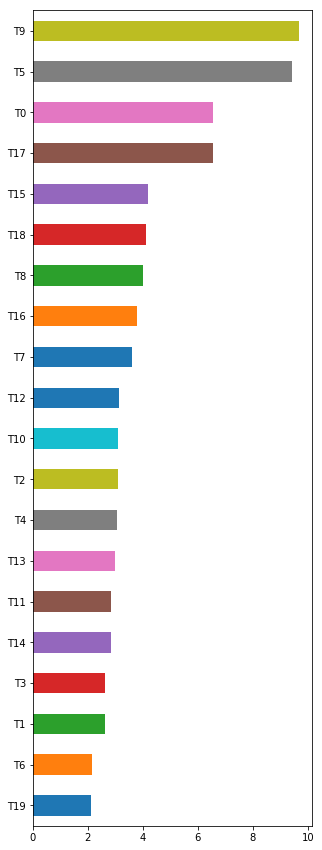

In [62]:
(TLM * np.log2(1/TLM)).sum().sort_values(ascending=True).plot(kind='barh', figsize=(5,15))

In [63]:
TLM.T.style.background_gradient(cmap='bwr')

doc_label,Argentina,Australia,Austria,Brazil,Bulgaria,Canada,Chile,Croatia,Cyprus,Czech Republic,England,France,Georgia,Germany,Greece,Hungary,Israel,Italy,Lebanon,Luxembourg,Macedonia,Mexico,Moldova,Morocco,New Zealand,Peru,Portugal,Romania,Slovenia,South Africa,Spain,Turkey,US,Ukraine,Uruguay
T0,0.0055067,0.0231578,0.485749,0.00159833,0.00410842,0.0970971,0.00403806,0.243015,0.00123672,0.134548,0.853741,0.0614101,0.118462,0.740044,0.021808,0.204742,0.0168798,0.00957741,0.013746,0.149884,0.0306246,0.00131162,0.00703407,0.00110203,0.0658393,0.00123672,0.0143407,0.0965027,0.3168,0.0179505,0.0118597,0.00126817,0.0416644,0.115767,0.0012788
T1,0.0129414,0.0322985,0.0148029,0.00203852,0.0319296,0.00353361,0.0201218,0.0018144,0.00157732,0.00199683,0.0068004,0.0156977,0.00856604,0.00879687,0.00174774,0.0217335,0.0070489,0.0130495,0.00151684,0.00285816,0.0170227,0.00167285,0.00840656,0.00140553,0.0228498,0.00157732,0.0159505,0.0753341,0.0134005,0.0044904,0.0107135,0.00161743,0.164408,0.00227326,0.00163099
T2,0.0122218,0.0119604,0.0154856,0.00142577,0.00133695,0.0233974,0.00707133,0.0813274,0.204801,0.0203941,0.000831073,0.00872033,0.0735974,0.00531642,0.0158585,0.0145494,0.00947934,0.00719333,0.0010609,0.00199904,0.00156547,0.00117002,0.0128197,0.000983051,0.00971918,0.0011032,0.00655231,0.0235392,0.0144919,0.0242086,0.00638221,0.00113125,0.0957981,0.00158995,0.010607
T3,0.00423878,0.00595579,0.00820362,0.000885513,0.00354632,0.0227711,0.00423146,0.109575,0.00068517,0.000867401,0.00051616,0.00373558,0.0844366,0.00700804,0.0408409,0.0246929,0.0224395,0.00348821,0.115328,0.00124155,0.000972277,0.00072667,0.0540984,0.00061055,0.00590945,0.00068517,0.00320888,0.000861823,0.000764776,0.00643401,0.00369494,0.000702595,0.0690363,0.000987482,0.000708486
T4,0.00726657,0.00723063,0.0135266,0.00133981,0.0300695,0.0130459,0.00960005,0.0132799,0.00103669,0.00131241,0.000780968,0.00560903,0.00116735,0.00382359,0.0117215,0.00994099,0.0549122,0.339475,0.000996938,0.00187851,0.00147109,0.0475114,0.117792,0.000923783,0.0152617,0.00103669,0.00674845,0.0232783,0.012797,0.0190148,0.00760507,0.0503805,0.00977071,0.00149409,0.00107196
T5,0.0314858,0.0842438,0.0178058,0.00146301,0.365086,0.0546856,0.0640179,0.00130216,0.20483,0.457373,0.00788589,0.0251972,0.156504,0.0353689,0.0175951,0.249291,0.186855,0.0151671,0.22711,0.814089,0.174824,0.0153572,0.108696,0.00100872,0.235344,0.00113201,0.00766807,0.205291,0.21225,0.24267,0.0364933,0.232322,0.0600547,0.684601,0.00117053
T6,0.013817,0.0269456,0.00795532,0.0296635,0.00126619,0.383195,0.00839797,0.00120185,0.00104481,0.00132269,0.000787088,0.00881207,0.00117649,0.00629948,0.00433859,0.00413055,0.00107476,0.00668217,0.00100475,0.00189324,0.00148262,0.00110809,0.00137385,0.000931022,0.0265353,0.00104481,0.00633494,0.00485333,0.0011662,0.020554,0.00877653,0.00107138,0.0916501,0.0015058,0.00108037
T7,0.0171298,0.073032,0.0175263,0.0694715,0.0120425,0.012176,0.0191274,0.00111871,0.0824517,0.00123119,0.00975874,0.0235048,0.0647093,0.0262316,0.0162949,0.0135519,0.0104572,0.0153887,0.0221396,0.00176227,0.0302497,0.0165021,0.00127881,0.000866617,0.109423,0.000972533,0.0244649,0.00825638,0.00108553,0.0146219,0.0231405,0.000997266,0.0244225,0.00140164,0.00100563
T8,0.0130512,0.0195941,0.00639445,0.0014356,0.0218076,0.102622,0.0196064,0.00127776,0.0011108,0.0421458,0.00506747,0.0106325,0.0012508,0.00245161,0.00314149,0.078194,0.030695,0.0180946,0.013625,0.00201281,0.178362,0.00117808,0.118815,0.000989824,0.0194414,0.0011108,0.00744492,0.0270394,0.00787014,0.030137,0.00918753,0.0850771,0.0883652,0.00160091,0.0168306
T9,0.0158518,0.408637,0.0240327,0.00158435,0.329928,0.0413976,0.0171473,0.379807,0.204924,0.21883,0.00092351,0.0418061,0.22265,0.0390156,0.239709,0.0915269,0.516542,0.0163332,0.0184742,0.00222138,0.105231,0.0284599,0.202562,0.799752,0.227144,0.0012259,0.0132585,0.329573,0.193872,0.366456,0.013237,0.415729,0.0410315,0.0017668,0.0140085


In [64]:
TLM.idxmax(1).sort_values()

doc_label
Austria            T0
Slovenia           T0
Germany            T0
England            T0
US                 T1
Portugal          T12
Argentina         T15
Spain             T15
Peru              T15
Mexico            T15
Uruguay           T15
Chile             T15
Brazil            T16
Moldova           T17
Greece            T17
Macedonia         T17
Lebanon           T17
France            T18
Italy              T4
Luxembourg         T5
Hungary            T5
Bulgaria           T5
Czech Republic     T5
Ukraine            T5
New Zealand        T5
Canada             T6
Morocco            T9
Romania            T9
Croatia            T9
South Africa       T9
Georgia            T9
Turkey             T9
Australia          T9
Cyprus             T9
Israel             T9
dtype: object

In [65]:
(TLM / TLM.sum()).T.style.background_gradient(cmap='bwr')

doc_label,Argentina,Australia,Austria,Brazil,Bulgaria,Canada,Chile,Croatia,Cyprus,Czech Republic,England,France,Georgia,Germany,Greece,Hungary,Israel,Italy,Lebanon,Luxembourg,Macedonia,Mexico,Moldova,Morocco,New Zealand,Peru,Portugal,Romania,Slovenia,South Africa,Spain,Turkey,US,Ukraine,Uruguay
T0,0.00140659,0.00591525,0.124076,0.000408266,0.00104942,0.0248017,0.00103145,0.0620739,0.000315898,0.034368,0.218073,0.0156861,0.030259,0.189031,0.00557046,0.0522978,0.00431166,0.00244638,0.00351118,0.0382853,0.0078225,0.000335031,0.00179673,0.000281494,0.0168175,0.000315898,0.00366307,0.0246499,0.0809211,0.00458514,0.00302935,0.000323932,0.0106424,0.0295707,0.000326648
T1,0.0233758,0.0583402,0.0267381,0.00368214,0.0576739,0.0063827,0.0363456,0.00327731,0.00284908,0.00360683,0.0122834,0.0283544,0.0154727,0.0158896,0.00315692,0.0392568,0.0127323,0.023571,0.00273984,0.00516264,0.0307479,0.00302164,0.0151846,0.00253879,0.0412732,0.00284908,0.0288111,0.136075,0.024205,0.00811092,0.0193515,0.00292153,0.296967,0.00410615,0.00294603
T2,0.0167494,0.0163911,0.0212222,0.00195395,0.00183222,0.0320649,0.00969088,0.111455,0.280669,0.0279491,0.00113894,0.0119508,0.100861,0.00728588,0.0217332,0.0199391,0.0129909,0.00985808,0.00145391,0.00273958,0.0021454,0.00160345,0.0175688,0.00134722,0.0133196,0.00151188,0.00897959,0.0322592,0.0198604,0.0331766,0.00874648,0.00155032,0.131286,0.00217895,0.0145364
T3,0.00690254,0.00969856,0.013359,0.00144199,0.00577492,0.0370811,0.00689063,0.178434,0.00111575,0.0014125,0.000840528,0.00608312,0.137499,0.0114121,0.0665064,0.0402106,0.0365411,0.00568029,0.187804,0.00202178,0.00158328,0.00118333,0.0880954,0.000994235,0.00962311,0.00111575,0.00522542,0.00140342,0.00124538,0.0104773,0.00601694,0.00114412,0.112421,0.00160804,0.00115372
T4,0.00860794,0.00856536,0.0160235,0.00158713,0.0356201,0.0154541,0.0113722,0.0157313,0.00122805,0.00155467,0.000925129,0.00664442,0.00138283,0.00452939,0.0138852,0.011776,0.0650486,0.40214,0.00118097,0.00222528,0.00174264,0.0562817,0.139536,0.00109431,0.0180789,0.00122805,0.00799416,0.0275753,0.0151593,0.0225248,0.00900892,0.0596804,0.0115743,0.00176989,0.00126984
T5,0.00601306,0.0160886,0.0034005,0.0002794,0.0697229,0.0104437,0.0122259,0.000248682,0.0391177,0.0873476,0.00150602,0.00481207,0.0298886,0.00675464,0.00336025,0.0476088,0.035685,0.00289657,0.0433727,0.155472,0.0333873,0.00293286,0.0207584,0.000192643,0.0449453,0.000216188,0.00146442,0.0392059,0.0405349,0.0463443,0.00696938,0.0443681,0.011469,0.130743,0.000223544
T6,0.0203049,0.0395981,0.0116908,0.0435922,0.00186074,0.563127,0.0123413,0.00176619,0.00153541,0.00194377,0.00115667,0.0129498,0.00172892,0.00925744,0.00637581,0.00607007,0.00157942,0.00981983,0.00147654,0.00278222,0.00217879,0.0016284,0.00201895,0.00136819,0.0389951,0.00153541,0.00930954,0.00713225,0.0017138,0.0302052,0.0128976,0.00157446,0.134685,0.00221286,0.00158766
T7,0.0223104,0.0951192,0.0228268,0.0904818,0.0156845,0.0158584,0.0249121,0.00145704,0.107388,0.00160354,0.0127101,0.0306134,0.0842794,0.0341648,0.021223,0.0176505,0.0136198,0.0200427,0.0288353,0.00229523,0.0393981,0.0214928,0.00166557,0.00112871,0.142516,0.00126666,0.0318639,0.0107534,0.00141382,0.019044,0.0301388,0.00129887,0.0318087,0.00182553,0.00130976
T8,0.0132142,0.0198388,0.00647434,0.00145353,0.0220801,0.103904,0.0198513,0.00129372,0.00112468,0.0426723,0.00513077,0.0107654,0.00126643,0.00248224,0.00318073,0.0791709,0.0310785,0.0183207,0.0137952,0.00203796,0.18059,0.0011928,0.120299,0.00100219,0.0196843,0.00112468,0.00753793,0.0273772,0.00796846,0.0305134,0.0093023,0.0861399,0.0894691,0.00162091,0.0170408
T9,0.00283846,0.0731715,0.00430335,0.000283698,0.0590777,0.00741275,0.00307044,0.0680092,0.0366941,0.0391841,0.000165366,0.00748591,0.0398683,0.00698623,0.0429228,0.016389,0.0924933,0.00292466,0.00330803,0.000397766,0.0188429,0.00509609,0.0362712,0.143205,0.0406729,0.000219513,0.0023741,0.0590141,0.0347151,0.0656184,0.00237025,0.0744414,0.0073472,0.000316367,0.0025084


# Components and Labels

In [66]:
CLM = D[['doc_label'] + COMPS].groupby('doc_label').mean().T 

In [67]:
CLM.style.background_gradient(cmap='bwr')

doc_label,Argentina,Australia,Austria,Brazil,Bulgaria,Canada,Chile,Croatia,Cyprus,Czech Republic,England,France,Georgia,Germany,Greece,Hungary,Israel,Italy,Lebanon,Luxembourg,Macedonia,Mexico,Moldova,Morocco,New Zealand,Peru,Portugal,Romania,Slovenia,South Africa,Spain,Turkey,US,Ukraine,Uruguay
PC0,-0.0438878,0.00162448,0.0773918,0.0771711,0.0278299,-0.00904469,-0.0175714,-0.0497758,0.0144897,-0.00843796,0.155127,0.0504489,0.000354531,0.112366,0.00879273,0.0595105,-0.0734463,-0.0417592,0.100548,0.178077,0.109177,-0.0937139,-0.0847578,-0.178188,0.0358236,-0.0503969,0.034336,-0.0228808,0.075103,0.00539755,-0.0166921,-0.0458385,-0.0113564,0.163014,-0.0512959
PC1,-0.0685385,-0.0352368,0.0209844,-0.0720786,-0.0971033,-0.0254834,-0.0800408,-0.0232595,-0.123094,-0.0761229,-0.0408343,0.119729,-0.0588384,-0.0429395,-0.0565425,-0.0995327,-0.0735274,-0.0680478,-0.0932741,-0.157582,-0.107782,-0.100137,-0.117033,-0.0525232,-0.047144,-0.087398,0.165409,-0.0696133,-0.0909517,-0.036973,-0.0787516,-0.0855098,-0.0121359,-0.137874,-0.0627971
PC2,-0.0422769,-0.0559765,0.0293409,-0.0510149,0.0206606,-0.0406707,-0.034372,0.0400391,-0.0608029,0.00643965,0.010738,0.0239826,0.0161342,-0.00980849,0.0469025,-0.00737996,0.04343,0.0983079,-0.0237833,0.00852434,0.0991282,-0.0454947,0.0225665,0.064859,-0.0462287,-0.0642158,0.0362251,0.0336237,0.0114487,0.0185496,-0.0271877,0.0413602,-0.0407393,-0.0507,-0.0531522
PC3,-0.0382345,-0.00898525,-0.00408753,-0.0275312,0.00943317,0.0207293,-0.0302728,0.0048395,-0.0529286,-0.0470857,-0.0074907,-0.00141883,-0.010456,-0.0178903,0.00875733,0.0479528,0.0130888,-0.01042,0.057435,-0.0383582,0.0456624,-0.0437267,0.0403293,-0.0250435,0.00365676,-0.142856,-0.00144352,0.0172007,-0.0207122,0.00592552,-0.0425048,0.00850112,0.0157688,-0.0320868,-0.0304777
PC4,0.0998693,-0.00669338,-0.0138154,0.0676031,0.0131461,-0.0108751,0.094705,0.00438089,-0.0148151,-0.0238924,-0.0209582,0.00724561,-0.0250393,-0.0176257,-0.0114755,-0.0439369,0.0328098,-0.0541324,-0.0780253,-0.05425,0.0231805,0.138909,0.0328767,0.000932275,-0.00512746,0.216596,0.0112514,0.0383499,-0.0148028,0.00274702,0.0974471,0.00278643,-0.00989244,-0.0116859,0.12377
PC5,0.0751839,-0.00822254,0.00225015,0.0630133,0.001171,0.00478371,0.0831114,-0.0199516,-0.0427611,-0.0177764,0.0265645,0.0182643,-0.0304856,-0.00157112,-0.0181056,0.0122536,-0.00649561,-0.00967613,0.0738833,0.0445971,-0.0370922,0.0202013,0.00713309,0.0422945,-0.0168494,0.175683,0.0292572,-0.0423975,0.0337842,0.0302365,0.0689033,-0.0164898,-0.0285045,0.0361662,0.0865258
PC6,-0.00535039,-0.0101732,-0.0218666,-0.0106982,0.0294509,-0.018441,-0.0166423,0.0233961,0.0842186,0.0602666,-0.0198462,-0.00934672,-0.00367054,-0.0199609,0.0296346,-0.000541247,0.0294268,0.0249045,0.0973743,-0.0547167,-0.0427749,4.87937e-05,0.0225545,-0.00169682,-0.0303183,0.00204911,0.000640349,0.0095711,-0.00757605,0.0120424,-0.0129054,0.0307702,-0.00177288,0.0556719,0.0148906
PC7,-0.00596704,0.0168939,0.00561988,0.0294218,-0.0434476,0.0134286,-0.000728413,-0.0207628,-0.0452024,0.027155,0.00446498,0.0103127,0.0108728,-0.0426859,0.0462004,-0.0649285,-0.0185182,0.00401816,-0.0479348,-0.109419,-0.0466124,-0.00085577,-0.0400125,-0.0846402,0.0282249,-0.0102557,-0.00230005,-0.0065905,-0.0594513,0.0148975,-0.00869655,-0.0805582,-0.00409468,-0.076304,0.00713026
PC8,-0.0196946,0.0182889,0.0552109,0.00636317,0.024203,-0.00860063,-0.0233272,0.0878208,-0.0170353,0.117756,0.0683113,0.00817205,0.0121557,0.0291334,0.0154166,-0.00517755,0.0587781,-0.0268718,0.0151251,0.0433846,0.00310638,-0.0419736,0.0508217,0.15074,0.0233245,-0.129174,0.00156138,0.0151181,0.071693,0.0266115,-0.0167563,0.0412288,0.00218141,0.0243292,-0.0634106
PC9,0.00994931,-0.0120898,-0.0232593,-0.00167025,-0.00409198,-0.00591567,0.0037977,0.0144107,-0.0403108,-0.0395703,-0.0155954,-0.00113917,0.0137503,-0.0455273,-0.00574353,-0.0387314,0.0179562,-0.0026909,-0.0595964,-0.0342019,0.0250924,0.0193337,0.0248119,0.161331,-0.0282959,0.00545998,0.00946251,-0.0382547,-0.0149231,-0.0145689,0.00669

In [68]:
CLM.idxmax(1).sort_index()

PC0    Luxembourg
PC1      Portugal
PC2     Macedonia
PC3       Lebanon
PC4          Peru
PC5          Peru
PC6       Lebanon
PC7        Greece
PC8       Morocco
PC9       Morocco
dtype: object

In [69]:
CLM.idxmax().sort_values()

doc_label
England           PC0
Lebanon           PC0
Ukraine           PC0
New Zealand       PC0
Hungary           PC0
Germany           PC0
Luxembourg        PC0
Macedonia         PC0
Slovenia          PC0
Brazil            PC0
Austria           PC0
Portugal          PC1
France            PC1
Georgia           PC2
Greece            PC2
Italy             PC2
Canada            PC3
US                PC3
Peru              PC4
Spain             PC4
Romania           PC4
Argentina         PC4
Chile             PC4
Mexico            PC4
Uruguay           PC4
South Africa      PC5
Cyprus            PC6
Bulgaria          PC6
Moldova           PC8
Israel            PC8
Czech Republic    PC8
Croatia           PC8
Australia         PC8
Morocco           PC9
Turkey            PC9
dtype: object

In [70]:
Q = pca_terms[COMPS].unstack().to_frame()

In [71]:
Q.index.names = ['pc_id','token_id']
Q.columns = ['weight']

In [72]:
L = Q.groupby('pc_id').apply(lambda x: pd.concat([x.sort_values('weight').head(10), x.sort_values('weight').tail(10)]))
L.index = L.index.droplevel(0)
L = L.reset_index()
L['sign'] = np.sign(L['weight']).astype('int')
L['token_str'] = L['token_id'].map(V.token_str)
VX = L.token_str.value_counts()
L = L.set_index(['pc_id','sign','token_id'])
L = L.token_str.unstack().fillna('').apply(lambda x: ' '.join(x), 1).str.replace(r'\s+',' ').str.strip().unstack()
L.columns = ['A', 'B']

In [73]:
VX

light         7
red           7
berry         6
white         5
rich          5
acidity       5
oak           5
soft          5
black         5
cabernet      5
fruity        4
cherry        4
ripe          4
finish        4
fruits        4
peach         4
sweet         4
blackberry    4
dry           4
flavors       4
sauvignon     4
fruit         3
bright        3
crisp         3
vanilla       3
aromas        3
firm          3
herbal        3
blend         3
tannins       3
             ..
good          2
lemon         2
merlot        2
chardonnay    1
structure     1
age           1
raspberry     1
citrus        1
barrel        1
tannic        1
character     1
cola          1
touch         1
followed      1
creamy        1
tart          1
silky         1
still         1
smooth        1
franc         1
currant       1
tight         1
texture       1
noir          1
years         1
aging         1
feels         1
pear          1
tropical      1
dense         1
Name: token_str, Length:

In [74]:
L

,A,B
pc_id,,
PC0,berry black blackberry cabernet cherry chocola...,acidity apple citrus crisp fresh lemon light p...
PC1,apple aromas cherry finish flavors nose notes ...,acidity aging character fruits fruity rich rip...
PC2,blackberry cabernet chocolate dry flavors good...,acidity alongside berry bright cherry fresh of...
PC3,aromas dark dense finish firm fruit full rich ...,blend cabernet crisp franc fruity light merlot...
PC4,alongside black blend cabernet fruit merlot of...,berry feels finish flavors fruity herbal light...
PC5,cherries cherry cola light noir pinot raspberr...,aromas berry blend cabernet finish fruits gree...
PC6,age dry firm green herbal still tannic tart ti...,creamy oak peach rich ripe smooth soft spice s...
PC7,apple black blackberry currant dry fruits lemo...,barrel bright followed fruit light oak red spi...
PC8,acidity berry chardonnay firm good oak pinot r...,black fruity full light nose notes pepper soft...


# PCs as Likelihoods

In [75]:
def pc_given_label(pc_col, label_col, label_val):
    docs = D.loc[D[label_col] == label_val, pc_col].copy()
    r = pd.Series(np.sign(docs)).value_counts() / docs.shape[0]
    return r

In [76]:
# pc_given_label('PC0', 'doc_label', 'doyle')

In [77]:
PRIORS = D.doc_label.value_counts() / D.shape[0]

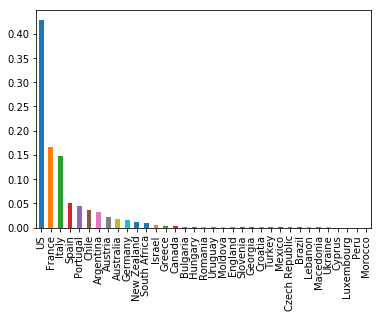

In [78]:
PRIORS.plot(kind='bar')

In [79]:
# labels

In [80]:
data = []
for i in PRIORS.index:
    for j in COMPS:
        t = (i, j)
        r = pc_given_label(j, 'doc_label', i)
        if 1 not in r.index.values:
            data.append([i, j, 0., 1.])
        elif -1 not in r.index.values:
            data.append([i, j, 1., 0.])
        else:
            data.append([i, j] + r.tolist())

In [81]:
P = pd.DataFrame(data, columns=['doc_label', 'pc_name', 'A', 'B'])

In [82]:
P.set_index(['doc_label', 'pc_name'])['A'].unstack().style.background_gradient(cmap='YlGn')

pc_name,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
doc_label,,,,,,,,,,
Argentina,0.736677,0.912226,0.774295,0.796238,0.880878,0.862069,0.611285,0.61442,0.61442,0.551724
Australia,0.556213,0.739645,0.869822,0.674556,0.591716,0.56213,0.568047,0.56213,0.639053,0.650888
Austria,0.816143,0.506726,0.668161,0.556054,0.64574,0.511211,0.650224,0.533632,0.748879,0.699552
Brazil,1,0,0,0.666667,1,1,0.666667,1,0.666667,0.666667
Bulgaria,0.666667,0.933333,0.533333,0.533333,0.6,0.666667,0.666667,0.866667,0.733333,0.533333
Canada,0.5,0.583333,0.708333,0.541667,0.625,0.541667,0.666667,0.541667,0.583333,0.666667
Chile,0.61157,0.936639,0.746556,0.77135,0.853994,0.887052,0.655647,0.581267,0.639118,0.506887
Croatia,0.8,0.6,1,0.6,0.6,0.8,0.6,0.6,1,0.6
Cyprus,1,0,0,0,0,0,1,0,0,0


In [83]:
P.set_index(['doc_label', 'pc_name'])['B'].unstack().style.background_gradient(cmap='YlGn')

pc_name,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
doc_label,,,,,,,,,,
Argentina,0.263323,0.0877743,0.225705,0.203762,0.119122,0.137931,0.388715,0.38558,0.38558,0.448276
Australia,0.443787,0.260355,0.130178,0.325444,0.408284,0.43787,0.431953,0.43787,0.360947,0.349112
Austria,0.183857,0.493274,0.331839,0.443946,0.35426,0.488789,0.349776,0.466368,0.251121,0.300448
Brazil,0,1,1,0.333333,0,0,0.333333,0,0.333333,0.333333
Bulgaria,0.333333,0.0666667,0.466667,0.466667,0.4,0.333333,0.333333,0.133333,0.266667,0.466667
Canada,0.5,0.416667,0.291667,0.458333,0.375,0.458333,0.333333,0.458333,0.416667,0.333333
Chile,0.38843,0.0633609,0.253444,0.22865,0.146006,0.112948,0.344353,0.418733,0.360882,0.493113
Croatia,0.2,0.4,0,0.4,0.4,0.2,0.4,0.4,0,0.4
Cyprus,0,1,1,1,1,1,0,1,1,1


#  Predicting Topics for PCs

In [84]:
def predict_topic_from_comp(pc='PC0', n=100, alpha=.01):
    pc_words = V.loc[V[pc] > 0].sort_values(pc).tail(n).token_str.index
    T = V.loc[pc_words, TOPICS]
    X = np.log(T + alpha).sum()
    max_t = X.idxmax()
    t_n = int(max_t.replace('T', ''))
    pc_n = int(pc.replace('PC', ''))
    t_words = topics.loc[t_n].topic_words
    pc_words = pca_items.loc[pc_n].pos
    pc_words_neg = pca_items.loc[pc_n].neg
    print(max_t, t_words)
    print(pc, '+', pc_words)
    print(pc, '-', pc_words_neg)
    print('-' * 80)
#     X.sort_values().plot(kind='bar')

In [85]:
_ = pca_items.apply(lambda x: predict_topic_from_comp('PC{}'.format(x.name)),  1)

T18 acidity crisp flavors ripe texture fruits character fruit fresh fruity 
PC0 + apple crisp citrus acidity lemon peach pear fresh white light lime fruity green bright clean
PC0 - black tannins cherry cabernet blackberry plum dark berry chocolate spice licorice firm red pepper merlot
--------------------------------------------------------------------------------
T12 tannins fruits fruit acidity ripe black rich structure wood aging 
PC1 + fruits ripe rich acidity tannins character aging fruity structure wood texture age full firm years
PC1 - aromas finish nose notes white cherry offers apple peach flavors lead green dried note alongside
--------------------------------------------------------------------------------
T4 tannins cherry black aromas alongside offers berry red spice pepper 
PC2 + red acidity bright alongside fresh offers tannins white cherry berry juicy black aromas opens fruits
PC2 - flavors oak cabernet sweet dry rich blackberry sauvignon chocolate good finish tannic va

In [86]:
X

pc_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
topic_id,,,,,,,,,,
T0,54.070889,-18.580764,0.503313,-5.592003,-9.316414,0.208360,-11.104346,-11.373659,26.455752,-20.827857
T1,-43.568211,25.001969,-59.621210,22.342858,3.530983,-55.405664,6.564101,-39.859701,-19.362798,-4.443496
T2,-17.633699,-1.767369,-6.901838,7.044451,-9.840047,-12.307255,-2.029152,-2.146981,10.047382,6.151756
T3,-19.874736,-14.717244,4.102961,2.655260,-3.204398,-11.394775,-11.059677,0.074229,27.729674,-0.459376
T4,-86.227486,-38.927544,90.916329,-11.701765,-22.203914,-10.959775,11.304345,-11.251474,-21.153999,4.593730
T5,52.465069,-33.016064,-4.087137,-5.141357,-11.590372,10.685628,-4.999032,-5.560131,11.975060,-5.659625
T6,-8.995752,0.033969,-15.620038,5.681146,-5.367960,-12.279743,-10.646045,19.043662,-2.393928,2.804887
T7,2.715830,2.576171,-8.740931,2.127888,-4.020947,-4.855818,-4.100056,0.750044,-0.710805,-2.255244
T8,-39.013813,-19.663220,-17.923926,35.339438,-17.172731,23.824144,3.633262,24.165478,1.442883,3.038913


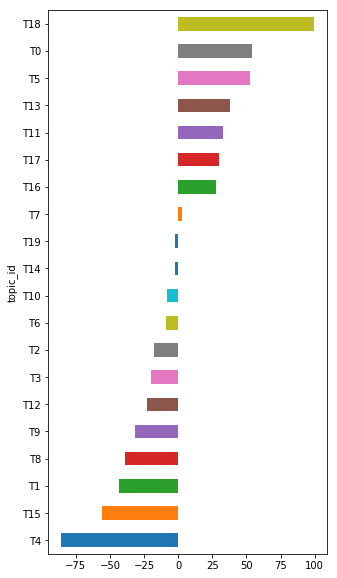

In [99]:
X.T.iloc[0].sort_values().plot(kind='barh', figsize=(5,10))

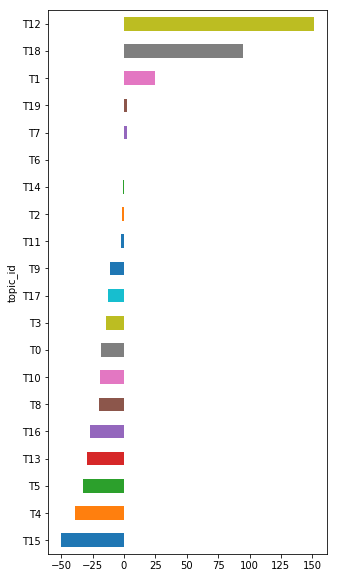

In [100]:
X.T.iloc[1].sort_values().plot(kind='barh', figsize=(5,10))

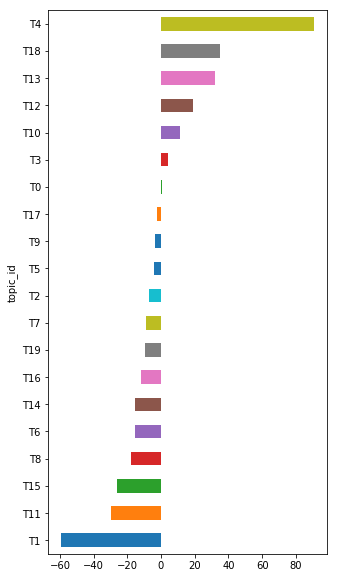

In [101]:
X.T.iloc[2].sort_values().plot(kind='barh', figsize=(5,10))

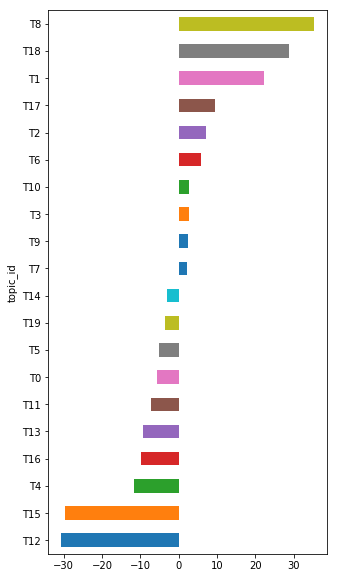

In [102]:
X.T.iloc[3].sort_values().plot(kind='barh', figsize=(5,10))

In [109]:
extrema = []
for i in range(4):
    extrema.append((X.T.iloc[i].sort_values().idxmax(), X.T.iloc[i].sort_values().idxmin()))

In [110]:
extrema

[('T18', 'T4'), ('T12', 'T15'), ('T4', 'T1'), ('T8', 'T12')]